# Project

The purpose of this lab work is to predict average house price. We're making use of the dataset provided by data.london.gov.uk which comprises of average house price by area from 1995 to 2023.

# Setup

First, let's import a few common modules, ensure MatplotLib plots figures inline and prepare a function to save the figures. We also check that Python 3.5 or later is installed, as well as Scikit-Learn ≥0.20.

In [1]:
# Python ≥3.5 is required
import sys
assert sys.version_info >= (3, 5)

# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"

# Common imports
import numpy as np
import os
import math

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)
import seaborn as sns

# This alloes us to save the figures if choose to do so.
PROJECT_ROOT_DIR = "."
CHAPTER_ID = "house_project"
IMAGES_PATH = os.path.join(PROJECT_ROOT_DIR, "images", CHAPTER_ID)
os.makedirs(IMAGES_PATH, exist_ok=True)

def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=300):
    path = os.path.join(IMAGES_PATH, fig_id + "." + fig_extension)
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)

In [4]:
# To plot prettier figures
plt.style.use("seaborn-whitegrid")
plt.rc("figure", autolayout=True, figsize=(18, 9))
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=14,
    titlepad=10,
)
plot_params = dict(
    color="0.75",
    style=".-",
    markeredgecolor="0.25",
    markerfacecolor="0.25",
    legend=False,
)
%config InlineBackend.figure_format = 'retina'

In [3]:
# For if you want to hide or restore the warnings in th outputs
# https://stackoverflow.com/questions/9031783/hide-all-warnings-in-ipython
import warnings
warnings.filterwarnings('ignore')
#warnings.filterwarnings('default')

# Get the Data

## Read the Data

In [3]:
import pandas as pd

def load_housing_data():
    return pd.read_csv("uk_avg_house_price.csv") # index_col='Month-Year', parse_dates=True)

 Our data is a time series, which is a set of observations recorded over time. The frequency of our data recording is on a montly basis.

## Take a Quick Look at the Data Structure

In [4]:
# There is no specific column we're aiming to predict.
housing = load_housing_data() 
housing.head()

,Month-Year,City of London,Barking & Dagenham,Barnet,Bexley,Brent,Bromley,Camden,Croydon,Ealing,...,NORTH EAST,NORTH WEST,YORKS & THE HUMBER,EAST MIDLANDS,WEST MIDLANDS,EAST OF ENGLAND,LONDON,SOUTH EAST,SOUTH WEST,England
0,NaN,E09000001,E09000002,E09000003,E09000004,E09000005,E09000006,E09000007,E09000008,E09000009,...,E12000001,E12000002,E12000003,E12000004,E12000005,E12000006,E12000007,E12000008,E12000009,E92000001
1,Jan-95,"91,449","50,460","93,285","64,958","71,307","81,671","120,933","69,158","79,886",...,"42,076","43,958","44,803","45,545","48,528","56,702","74,436","64,019","54,705","53,203"
2,Feb-95,"82,203","51,086","93,190","64,788","72,022","81,658","119,509","68,951","80,897",...,"42,572","43,925","44,529","46,052","49,341","56,594","72,778","63,715","54,356","53,096"
3,Mar-95,"79,121","51,269","92,248","64,367","72,016","81,449","120,282","68,712","81,380",...,"42,370","44,435","45,200","45,384","49,442","56,171","73,897","64,114","53,583","53,201"
4,Apr-95,"77,101","53,134","90,763","64,278","72,966","81,124","120,098","68,610","82,189",...,"42,096","44,268","45,614","46,124","49,456","56,568","74,455","64,623","54,786","53,591"


In [5]:
print(housing.iloc[1:6,1:8])

  City of London Barking & Dagenham  Barnet  Bexley   Brent Bromley   Camden
1         91,449             50,460  93,285  64,958  71,307  81,671  120,933
2         82,203             51,086  93,190  64,788  72,022  81,658  119,509
3         79,121             51,269  92,248  64,367  72,016  81,449  120,282
4         77,101             53,134  90,763  64,278  72,966  81,124  120,098
5         84,409             53,042  90,258  63,997  73,704  81,543  119,929


Note, prices are representitive interger values of average prices of houses per area.

In [6]:
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 338 entries, 0 to 337
Data columns (total 46 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   Month-Year            337 non-null    object
 1   City of London        338 non-null    object
 2   Barking & Dagenham    338 non-null    object
 3   Barnet                338 non-null    object
 4   Bexley                338 non-null    object
 5   Brent                 338 non-null    object
 6   Bromley               338 non-null    object
 7   Camden                338 non-null    object
 8   Croydon               338 non-null    object
 9   Ealing                338 non-null    object
 10  Enfield               338 non-null    object
 11  Greenwich             338 non-null    object
 12  Hackney               338 non-null    object
 13  Hammersmith & Fulham  338 non-null    object
 14  Haringey              338 non-null    object
 15  Harrow                338 non-null    ob

In [7]:
# Notice that Month-Year is the only nominal/categorical variable, with each value being a unique count.
housing["Month-Year"].value_counts()

Jan-95    1
Jul-13    1
Mar-14    1
Feb-14    1
Jan-14    1
         ..
Apr-04    1
Mar-04    1
Feb-04    1
Jan-04    1
Jan-23    1
Name: Month-Year, Length: 337, dtype: int64

In [8]:
# Here's useful description of the data counts and distributions of variables
housing.describe()

,Month-Year,City of London,Barking & Dagenham,Barnet,Bexley,Brent,Bromley,Camden,Croydon,Ealing,...,NORTH EAST,NORTH WEST,YORKS & THE HUMBER,EAST MIDLANDS,WEST MIDLANDS,EAST OF ENGLAND,LONDON,SOUTH EAST,SOUTH WEST,England
count,337,338,338,338,338,338,338,338,338,338,...,338,338,338,338,338,338,338,338,338,338
unique,337,338,337,338,337,337,338,337,336,338,...,338,337,338,338,337,338,338,338,337,338
top,Jan-95,E09000001,"164,000",E09000003,"64,788","246,766",E09000006,"854,686","216,699",E09000009,...,E12000001,"146,681",E12000003,E12000004,"49,598",E12000006,E12000007,E12000008,"180,356",E92000001
freq,1,1,2,1,2,2,1,2,2,1,...,1,2,1,1,2,1,1,1,2,1


In [9]:
# Cleaning up the Area codes since they'll be of no use to us
housing.drop(housing.index[0], inplace=True)

In [10]:
housing.describe()

,Month-Year,City of London,Barking & Dagenham,Barnet,Bexley,Brent,Bromley,Camden,Croydon,Ealing,...,NORTH EAST,NORTH WEST,YORKS & THE HUMBER,EAST MIDLANDS,WEST MIDLANDS,EAST OF ENGLAND,LONDON,SOUTH EAST,SOUTH WEST,England
count,337,337,337,337,337,337,337,337,337,337,...,337,337,337,337,337,337,337,337,337,337
unique,337,337,336,337,336,336,337,336,335,337,...,337,336,337,337,336,337,337,337,336,337
top,Jan-95,"91,449","164,000","93,285","64,788","246,766","81,671","854,686","216,699","79,886",...,"42,076","146,681","44,803","45,545","49,598","56,702","74,436","64,019","180,356","53,203"
freq,1,1,2,1,2,2,1,2,2,1,...,1,2,1,1,2,1,1,1,2,1


In [34]:
# let's visually inspect the data (theres too much to plot together)

%matplotlib inline
import matplotlib.pyplot as plt
#pd.hist(bins=30, figsize=(20,15))
#save_fig("attribute_histogram_plots")
#plt.show()

#housing['City of London'].hist(bins=10)
housing.plot(kind="scatter", x="Month-Year", y="City of London", alpha=0.2, figsize=(60,35), fontsize=4)
plt.xticks(rotation = 90)
plt.show()

# Lets make a data set to use in our models using 'City of London' to start 

In [12]:
X = pd.DataFrame(housing)
cols = [0,1]
remake = X[X.columns[cols]]
#remake = remake.to_period()
# Should I push month-year through encoding to turn the months into purely numerical values as well?

In [13]:
remake.set_index('Month-Year', drop = True, inplace = True)
remake.head()

,City of London
Month-Year,
Jan-95,"91,449"
Feb-95,"82,203"
Mar-95,"79,121"
Apr-95,"77,101"
May-95,"84,409"


In [14]:
remake.info()
# We've got all our values transfered, all 337

<class 'pandas.core.frame.DataFrame'>
Index: 337 entries, Jan-95 to Jan-23
Data columns (total 1 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   City of London  337 non-null    object
dtypes: object(1)
memory usage: 5.3+ KB


<b>'Timestamp' or 'PeriodIndex' dtype for index neccesary for forecasting, parse dates at load?</b>

In [15]:
# Removing commas and converting to float so we can run arithmetic operations on the contents.
remake.replace(',','', regex=True, inplace=True)
remake['City of London'] = remake['City of London'].astype(float)
print(remake.dtypes)

City of London    float64
dtype: object


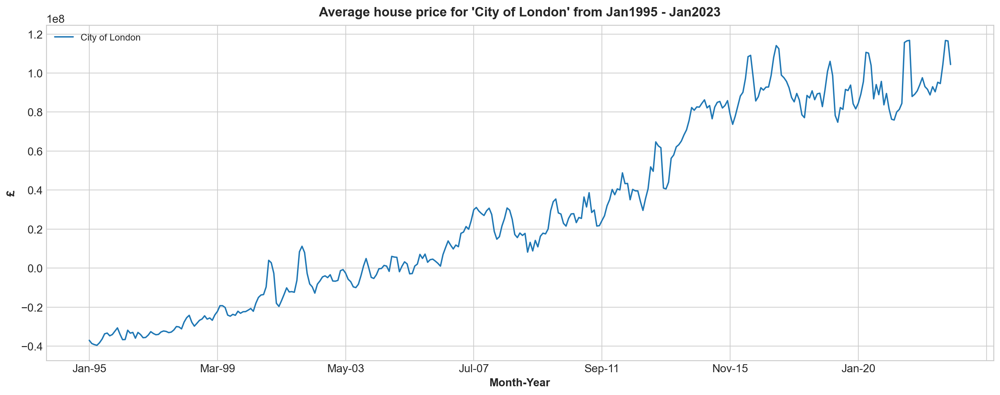

In [70]:
remake.plot(figsize=(15, 6))
plt.title("Average house price for 'City of London' from Jan1995 - Jan2023")
plt.ylabel("£", fontsize=12)
plt.show()

As demonstrated in the cell below, we can use this function to extract any area we want, provided we know the name of the area. It will perform everthing we did above automatically, extracting the given area prices, setting index to date and converting all values inside to float so we can use them. You can always look at the name of the area you want from the description of the data we're using from the beginning of this file.

In [17]:
def extract(z,name): # z=Dataframe to extract from, n=name of area to extract as string
    X = pd.DataFrame(housing)
    
    for column_headers in X.columns:
        if column_headers == name:
            cNum = int(X.columns.get_indexer([name]))
            #print(cNum)
        
    cols = [0,cNum]
    remake = X[X.columns[cols]]
    remake.set_index('Month-Year', drop = True, inplace = True)
    remake.replace(',','', regex=True, inplace=True) # Removing commas and converting to float.
    
    remake[name] = remake[name].astype(float)
    return remake

remake_test = extract(housing, "Barnet")
remake_test.head()
#remake.info()

,Barnet
Month-Year,
Jan-95,93285.0
Feb-95,93190.0
Mar-95,92248.0
Apr-95,90763.0
May-95,90258.0


array([[<AxesSubplot: title={'center': 'City of London'}>]], dtype=object)

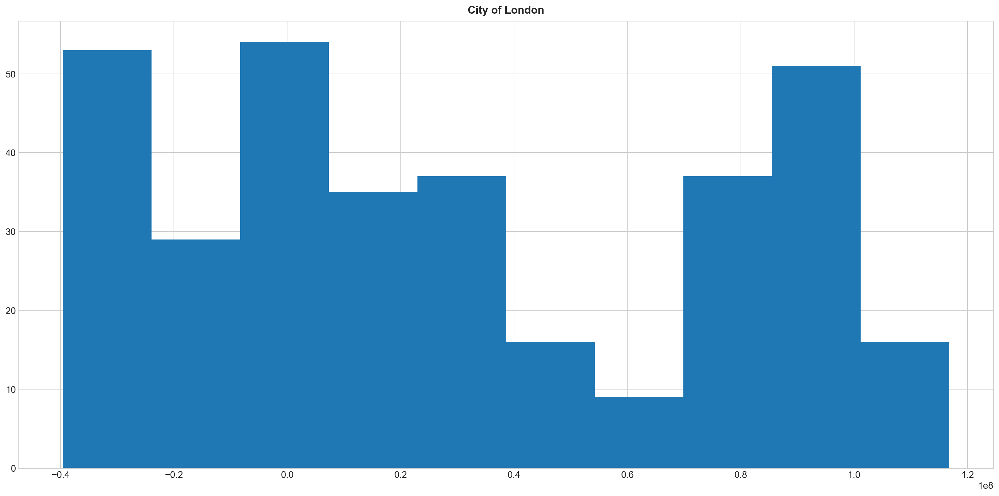

In [71]:
remake.hist() # not exactly a bell curve (Gaussian distribution of the dataset)

### Visualising a Rudimentary model

https://www.kaggle.com/code/ryanholbrook/linear-regression-with-time-series <br>
This tutorial helped me gain a deeper understanding of what we're doing and I used it as a basis for mkaing this rudimentary model.

We're going to use libraries to implement a quick and dirty version of what we're going to actually be doing further down. This should help us understand on a surface level whats going on.

In [21]:
remake2 = remake.copy()
remake2['Lag_1'] = remake2['City of London'].shift(1)
remake2.head()
# We've created a new column that is just our values shifted on step forward, as you can see in the table below.

,City of London,Lag_1
Month-Year,,
Jan-95,91449.0,NaN
Feb-95,82203.0,91449.0
Mar-95,79121.0,82203.0
Apr-95,77101.0,79121.0
May-95,84409.0,77101.0


This lag column basically represents what we're doing with our time series when we create splits, we're introducing lag into our training sets that we make use of to make our predictions.
If we were looking to add more features to our regression down the line, we could create more lags with more bigger time steps, use autocorelation to check how well the series responds to its own lags and, use partial corelation to determine the lag that is least influenced by any intermediate lags and has the best correaltion to the time series. 

In [23]:
# To use our lag features column with sklearn, we have to deal with the missing values a lag column creates. 
from sklearn.linear_model import LinearRegression

X = remake2.loc[:, ['Lag_1']]
X.dropna(inplace=True)  # drop missing values in the feature set (there are other ways to handle it)
y = remake2.loc[:, 'City of London']  # create the target
y, X = y.align(X, join='inner')  # drop corresponding values in target

model = LinearRegression()
model.fit(X, y)

y_pred = pd.Series(model.predict(X), index=X.index)
y_pred # Predictions using time lag

Month-Year
Feb-95     96137.638381
Mar-95     86948.921851
Apr-95     83886.016341
May-95     81878.531224
Jun-95     89141.254607
              ...      
Sep-22    834418.116651
Oct-22    830737.064734
Nov-22    885463.891674
Dec-22    954002.613739
Jan-23    952554.640564
Length: 336, dtype: float64

We used the sklearn implementation of linear regression to get quick set of predictions from training data X and target values y.

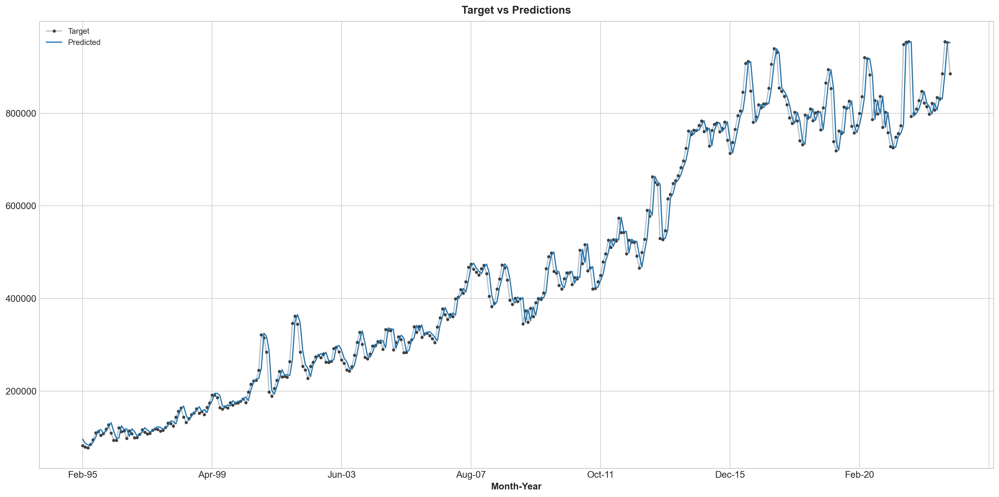

In [72]:
# The following time plot shows us how our forecasts now respond to the behavior of the series in the recent past.
ax = y.plot(**plot_params, label="Target")
ax = y_pred.plot(label="Predicted")
ax.set_title('Target vs Predictions');
ax.legend()

You can see in the graph above how we've plotted the predictions we got making use of lagged data against the actual data.  It is worth noting we did not run this on a dedicated test set containing entirely unseen data because we did not create one for this analysis. This is in essence the entiety of what we're doing. Creating a time series (just lagged data in essence) as training data and a corresponding test set of unseen data, and putting them through regressions to get back predictions. It is obviously far more complex, how we go about doing each of these things.

# Split into test and train sets

We're starting with the <b> City of london area </b> to test our data set, we've seperated it from the rest of the data, coverted it to float to be operated on and split it into our train and test sets.

<b> Note </b>, I'm choosing to use 'City of London' to demonstrate on our models, but you could just as easily use any other area from the data set and it will all work the same.

<b> Splitting our data this way is bad, we cant lose the existing format of the data. No shuffling, it destorys the dependence of data from one observation to another. We shuffle for ML applications but that is not true for forecasting. </b>

I'm gonna split the data by year, roughly the first 19 years for training and the remaining 9 for testing. <br>
It is also worth noting, the split below is just to plot the graph, we will be using a different splitting method for the data we're going to put into our model.

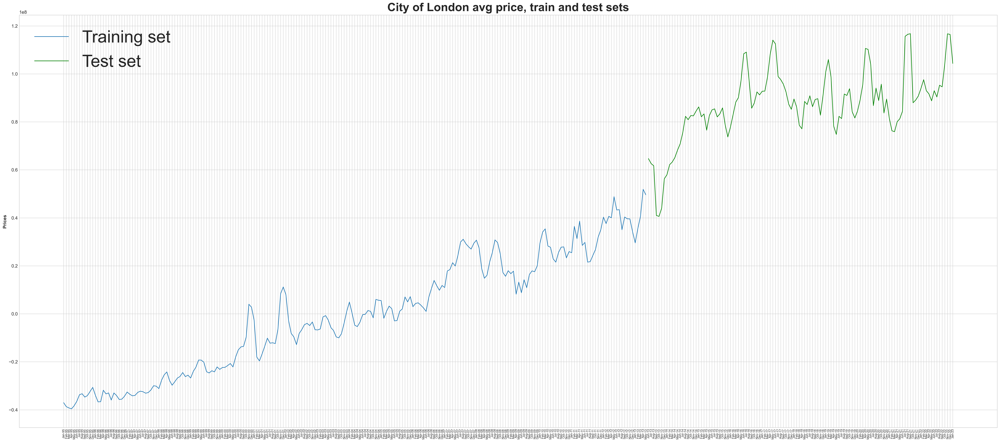

In [73]:
# 337/3  = 112 Observations (roughly 1/3rd for training)
test_size = 116 # adjusted for the time series splits

train = remake[:-test_size] # creating df sets
test = remake[-test_size:]

# Lets visualize our data split.
plt.figure(figsize = (36, 16))
plt.title('City of London avg price, train and test sets', size=30)
plt.plot(train, label='Training set')
plt.plot(test, label='Test set', color='green') #test set in green
plt.xticks(rotation = 90, size=8)
plt.ylabel('Prices')
plt.legend(fontsize=44);
# I need to figure out how to display the ticks unobstructed

### Normalization and Standarization

Before We set out actually splitting our data into different sets, lets just quickly normalize and standarize it. This will help us achieve more consistent results from the regression models as well as make sure that a single large observation doesn't skew the data too hard in one direction or dominate the dataset in our NN models. Normalization will scale our values to be between the scale of 0 to 1, or very close by in the case of our training data. And for standardization, it is true that it assumes our data has a gaussian distribution, but it does not mean that it can not help us despite our data not squarely falling in that bracket.

For <b>normalization</b> we're utilizing the method that makes use of the minimum and maximum values of our dataset to normalize all the data points within.<br> <br>
Normalization = (X - min) / (max - min) <br> <br>
Where X is a data point, min and max are the minimum and maximum values that exist in our training set respectively. 

For <b>standardization</b> we're utilizing the method that makes use of the mean and standard deviation of our dataset to standardize all the data points within.<br> <br>
Standardization = (X - mean) / standard deviation <br> <br>
Where X is a data point, mean and standard deviation is taken from our training set. 

Both of these are applied to the entirety of our series.

In [ ]:
# Test cell
# We're manually finding the point it is split at to know where to apply standardization
print(list(np.where(remake["City of London"] == 546793.)),"\n")# should help us locate the end train and start of test
print(math.floor(len(remake)*(2/3)-3),"\n") # I can use this for any of my columns
print(remake.iloc[math.floor(len(remake)*(2/3)-4):math.floor(len(remake)*(2/3)-3),:])
remake.info(0)

<b> Max-Scaling </b> <br>
We divide by our entire series by the biggest value in our series to scale our data further in case normalization isn't enough by itself to appropriately scale our data. This sort of scaling is called Max-Scaling, it is not appropriate for every instance of normalization but it should work fine for our purposes since we're only making use of one column of data. <b>Note,</b> I did try max scaling my data in conjunction with normalization and standardization but, the resulting mse was higher having used it. So for my models, I will not be using it.

In [ ]:
# Test cell for max scaling
print("Lib func: ",remake.max())
print(list(np.where(remake["City of London"] == 954884.0)),"\n")
print(remake.iloc[318:323,:])
divtest = remake.copy()
maxDiv(divtest)
print(divtest.iloc[318:323,:])

In [923]:
# Division by max (max-scaling)
def maxDiv(z):
    hi = 0
    
    temparr = np.empty(0, dtype=object) 
    for i in range(0,len(remake),1): # Converting df to usable vals
        temparr = np.append(temparr,remake.iloc[i:i+1,:])
        
    for i in range(0,len(temparr),1): # Find highest val in data
        if temparr[i] > hi:
            hi = temparr[i]
    
    for i in range(0,len(z),1):
        z.iloc[i:i+1,:] = z.iloc[i:i+1,:] / hi # Dividing each value by hi

In [ ]:
print(remake.iloc[218:225,:])
maxDiv(remake)
print(remake.iloc[218:225,:])

<b> Normalization </b> <br>
We're going to be scaling our using the normalization formula defined above. We should end up with a range of values between 0 and 1 (or very close in case of our training set). We calculate the min and max based on our training set and use these parameters to apply normalization to our training set and onto our testing set as well.

In [ ]:
# Test cell
# finding lowest val in train set
low = 1000000000
temparr3 = np.empty(0, dtype=object)
for i in range(0,math.floor(len(remake)*(2/3)-3),1):
    temparr3 = np.append(temparr3,remake.iloc[i:i+1,:])
    
for i in range(0,len(temparr3),1):
    if temparr3[i] < low:
        low = temparr3[i]

print("panda func: ", trainX.min())
print("My func: ", low)

In [ ]:
# Test cell
# finding highest val in train set
hi = 0
temparr4 = np.empty(0, dtype=object)
for i in range(0,math.floor(len(remake)*(2/3)-3),1):
    temparr4 = np.append(temparr4,remake.iloc[i:i+1,:])
    
for i in range(0,len(temparr4),1):
    if temparr4[i] > hi:
        hi = temparr4[i]

print("panda func: ", trainY.max()) 
# coming out diff because our train data being a time series also holds some testing values
print("My func: ", hi) # works correct

In [ ]:
# Test cell
normalize = (remake.iloc[220:221,:] - low)/(hi - low)
print(normalize) # works

In [ ]:
# Test cell
NORM = remake.copy()
print(NORM)

low, hi = normalTrain(NORM)
print(NORM.iloc[218:225,:]) # We can clearly see the dif in normalized val between 
print("lowest val of training data:",low, "highest val of training data", hi)

normalTest(NORM,low,hi)
print(NORM.iloc[218:225,:]) # We can clearly see the dif in val between 

In [36]:
def normalData(z):
    
    low = 10000000000
    hi = 0
    
    temparr = np.empty(0, dtype=object) 
    for i in range(0,math.floor(len(z)*(2/3)-3),1): # Converting df to usable vals
        temparr = np.append(temparr,remake.iloc[i:i+1,:])
    
    for i in range(0,len(temparr),1): # Find lowest val in training data
        if temparr[i] < low:
            low = temparr[i]
            
    for i in range(0,len(temparr),1): # Find highest val in training data
        if temparr[i] > hi:
            hi = temparr[i]

    for i in range(0,math.floor(len(z)*(2/3)-3),1):
        z.iloc[i:i+1,:] = ((z.iloc[i:i+1,:]) - low) / (hi - low) # Applies normalization to training data
        
    for i in range(math.floor(len(z)*(2/3)-3),len(z),1):
        #print(((z.iloc[i:i+1,:]) - low) / (hi - low)) # Works 
        z.iloc[i:i+1,:] = ((z.iloc[i:i+1,:]) - low) / (hi - low) # Applies normalization to testing data

In [37]:
# We're going to be Normalizing the data itself as well, as opposed to doing just the test and train sets,
# so we have something to plot against for the predictions.
print(remake.iloc[218:225,:]) 

normalData(remake)

print(remake.iloc[218:225,:]) # We can clearly see the dif in vals

            City of London
Month-Year                
Mar-13            527874.0
Apr-13            590685.0
May-13            578037.0
Jun-13            662700.0
Jul-13            651116.0
Aug-13            645847.0
Sep-13            529619.0
            City of London
Month-Year                
Mar-13            0.877701
Apr-13            1.000000
May-13            0.975373
Jun-13            1.140220
Jul-13            1.117665
Aug-13            1.107406
Sep-13            0.881098


It is worth mentioning that normalData first calculates the parameters it needs using the training data. It uses these parameters calculated from the training data on both our test and training data to normalize them. These functions can work on any of the data columns from the original housing dataframe, provided the data has been extracted and readied using the 'extract' function that was made further up in this file.

In [38]:
print("our min:", remake.min(),"and our max: ", remake.max())
# We can see our test scaled values are close to our train range, this should suffice in this form.

our min: City of London    0.0
dtype: float64 and our max:  City of London    1.709132
dtype: float64


<b> Standardization </b> <br>
We're standardizing our data here according to the formula defined above. Standardizing the data scales it to have mean of 0 and a standard deviation of 1. This bring down all the data in the series to a common scale without distorting the differences in the range of the values.

In [ ]:
# Test cell for standardizing functions manually on test array
summ = 0
temparr = np.empty(0, dtype=object)
for i in range(0,math.floor(len(remake)*(2/3)-3),1):
    temparr = np.append(temparr,remake.iloc[i:i+1,:])
    
for i in range(0,len(temparr),1):
    summ = summ + temparr[i]
    
print("sum:", summ)
print("remake:", remake.max())
print("larger vals:",remake.loc[remake['City of London'] > 800000])
print(temparr)
print(len(temparr))

STAND = remake.copy()
print(STAND)
mean, std = standTrain(STAND)
print(STAND.iloc[218:225,:]) # We can clearly see the dif in val between 
print("Mean of training data:",mean, "STD of training data", std)
standTest(STAND,mean,std)
print(STAND.iloc[218:225,:]) # We can clearly see the dif in val between 

Very large values in our data would make the mean too big for other values. To circumvent this, we normalize our data before standardizing it. This elminate our extremely high mean caused by a few outliers.

In [39]:
def standData(z):
    
    temparr = np.empty(0, dtype=object) # can't operate on Df here
    for i in range(0,math.floor(len(z)*(2/3)-3),1):
        temparr = np.append(temparr,z.iloc[i:i+1,:])
    
    summ = 0
    count = 0
    summDist = 0
    countDist = 0
    
    for i in range(0,len(temparr),1):
        summ = summ + temparr[i] # operating on df, not np
        count = count + 1
        
    #print("sum:",summ,"count:",count)
    mean = summ / count
    print("mean:", mean)
    
    for i in range(0,len(temparr),1):
        #print("Values:", temparr[i])
        dist = temparr[i] - mean  # dist of x from mean
        #print("dist from mean:", dist)
        temp = dist * dist # square of dist
        summDist = summDist + dist # sum of sq dist
        countDist = countDist + 1
        
    #print("sum dist", summDist,"count:", countDist)
    std = math.sqrt(summDist/countDist) # calc Standard deviation
    
    for i in range(0,math.floor(len(z)*(2/3)-3),1):
        #print(((z.iloc[i:i+1,:]) - mean) / std) # Finally Works 
        z.iloc[i:i+1,:] = ((z.iloc[i:i+1,:]) - mean) / std # Apply standardization to training data  
        
    for i in range(math.floor(len(z)*(2/3)-3),len(z),1):
        #print(((z.iloc[i:i+1,:]) - mean) / std)
        z.iloc[i:i+1,:] = ((z.iloc[i:i+1,:]) - mean) / std # Apply standardization to testing data

It is worth mentioning that standData first calculates the parameters it needs using the training data. It uses these parameters calculated from the training data on both our test and training data to standardize them. These functions can work on any of the data columns from the original housing dataframe, provided the data has been extracted and readied using the 'extract' function that was made further up in this file.

In [40]:
# We're going to be standardizing the data itself as well so we have something to plot against for the predictions.
print(remake.iloc[218:225,:])  

standData(remake)

print(remake.iloc[218:225,:]) # We can clearly see the dif in vals

            City of London
Month-Year                
Mar-13            0.877701
Apr-13            1.000000
May-13            0.975373
Jun-13            1.140220
Jul-13            1.117665
Aug-13            1.107406
Sep-13            0.881098
mean: 0.4325806973871418
            City of London
Month-Year                
Mar-13        4.070798e+07
Apr-13        5.189275e+07
May-13        4.964051e+07
Jun-13        6.471647e+07
Jul-13        6.265370e+07
Aug-13        6.171545e+07
Sep-13        4.101872e+07


### Now lets structure and split the standardized data

Now lets take a look at building our matrix X and vector Y of training observations (input vectors). <br>
We achieve this by splitting the data further into vectors of set sizes for x and 1 data point for y. We keep doing these data splits progressively with a step size of 1 for all our training data until we end up with a matrix of complied vectors for x and one vector for y. We then use these in our regression to make predictions in accordance for the step we used to build our time series. In our case, a time series with one step is making predictions per step (per month basically as one step signifies one month). <br>
Let's start by making x, a matrix of Nx5 (rowXcol) size, we verify this checking our resulting arrays size. 
<br> The approach we're taking here is to build a linear autoregressive model. It does this by making use of lagged inputs, denoted by our time series, as we demonstrated further up.

In [41]:
# Calc input vectors from remake set (I wonder if i could call this whole process a transformer)

# where z(obj) = input data to use to create input vectors,
# sp(int) = the split for the data and st(int) = is the steps for the split. 
def inVec(z,sp,st):
    # create a simple array with numpy empty()
    X = np.empty(0, dtype=object)
    Y = np.empty(0, dtype=object)
    for i in range(0,len(z.index)-sp,st):
        X = np.append(X,z.iloc[i:i+sp,:])
        # should grab Y
        Y = np.append(Y,z.iloc[i+sp:i+sp+1,:])
    temp = int(len(X)/sp)
    X = np.reshape(X,(temp,sp))
    Y = np.reshape(Y,(len(Y),1))
    return X, Y

X, Y = inVec(remake,5,1)
print(len(X)) # size 332,5 design matrix
print(len(Y)) # size 332,1 input vector on train set

332
332


The way we've designed our matrix, you can look at it as having created rows of data holding a sequence of 5 observations where each subsequent row also holds data of a sequence of 5 observations, but these observation have shifted forward one step, meaning + one observation at the end and - one observatoin at the start of our row. This allows each sequence to serve as a predictor for the next observation. This is basically just implementing the lag of one time step we spoke off earlier.

In [42]:
print(X[218:225,:]) # Checking resulting values
print("Dimension =", X.shape) # Verify shape
print("Size =", X.size)
print("Array type =", X.dtype, '\n') # Verify datatype

[[40707983.07622428 51892745.55390773 49640514.64184232 64716465.44103535
  62653701.13953586]
 [51892745.55390773 49640514.64184232 64716465.44103535 62653701.13953586
  61715449.66296465]
 [49640514.64184232 64716465.44103535 62653701.13953586 61715449.66296465
  41018715.440357275]
 [64716465.44103535 62653701.13953586 61715449.66296465
  41018715.440357275 40618948.014868125]
 [62653701.13953586 61715449.66296465 41018715.440357275
  40618948.014868125 44076891.72781863]
 [61715449.66296465 41018715.440357275 40618948.014868125
  44076891.72781863 56293926.70686539]
 [41018715.440357275 40618948.014868125 44076891.72781863
  56293926.70686539 58003399.88490365]]
Dimension = (332, 5)
Size = 1660
Array type = object 



In [43]:
print(Y[218:225,:])
print("Dimension =", Y.shape)
print("Size =", Y.size)
print("Array type =", Y.dtype, '\n')

[[61715449.66296465]
 [41018715.440357275]
 [40618948.014868125]
 [44076891.72781863]
 [56293926.70686539]
 [58003399.88490365]
 [62162761.81121799]]
Dimension = (332, 1)
Size = 332
Array type = object 



In [44]:
def split(z,c): #z(designMatX),c(inputVecY)
    trainX = z[0:math.floor(math.floor(len(z)*(2/3))):1]
    trainX = trainX.astype(float)
    trainY = c[0:math.floor(math.floor(len(c)*(2/3))):1]
    trainY = trainY.astype(float)
    testX = z[math.floor(math.floor(len(z)*(2/3))):len(z):1]
    testX = testX.astype(float)
    testY = c[math.floor(math.floor(len(c)*(2/3))):len(c):1]
    testY = testY.astype(float)
    return trainX, trainY, testX, testY

# This function is splitting our data by 2/3rds for training and 1/3rd for testing for both X and Y
    
trainX, trainY, testX, testY = split(X,Y)
print(len(trainX))
print(len(trainY))
print(len(testX))
print(len(testY))

221
221
111
111


In [45]:
# Check data type before running through our algebra
print(trainX.dtype)
print(trainY.dtype)
print(testX.dtype)
print(testY.dtype)

float64
float64
float64
float64


## Lets first play around with the tools at our disposal to see if they function as intended before we make our proper models

In [46]:
# Working this out step by step for OLS fitting (finding weights)
# matrix multiplication has to be done through the dot monicor
X = trainX
print(X.shape)

X_b = X.T.dot(X) # Xt * X
print("one", X_b.shape)
X_b = np.add(X_b,0.0001*np.eye(5)) # X_b * λI (replaces np.ones to stabilize inversion)
print("two", X_b.shape)
X_b = np.linalg.inv(X_b) # X -1 
print("three", X_b.shape)
X_b = X_b.dot(X.T) # inverse * Xt   (NOT * X_B, BIG DIFFERENCE)
print("four", X_b.shape)
theta_b_t = X_b.dot(trainY) # X_b * Y
print(theta_b_t)
# DONE

(221, 5)
one (5, 5)
two (5, 5)
three (5, 5)
four (5, 221)
[[-0.08696145]
 [ 0.63948592]
 [-0.7134482 ]
 [-0.01262478]
 [ 1.16695598]]


In [47]:
# Our first Auto regressive modlel
X_new_b = trainX
test1_predict = X_new_b.dot(theta_b_t) # should be Yt = Xt * W 
#print(len(test1_predict))
test1_predict[90:96,:]

array([[-3365578.02721407],
       [-6328209.48640189],
       [-8090428.46815219],
       [-4274767.62915483],
       [ -584986.3025538 ],
       [  -62846.22810832]])

In [48]:
# Calculating MSE for training
from sklearn.metrics import mean_squared_error

test1_mse = mean_squared_error(trainY, test1_predict)
print("Mean square error", test1_mse, "\n")

Mean square error 13152454949302.818 



In [49]:
# Our first OLS fitting (finding weights)

X = testX
print(X.shape)

X_b = X.T.dot(X) # Xt * X
print("one", X_b.shape)
X_b = np.add(X_b,0.0001*np.eye(5)) # X_b * λI (replaces np.ones to stabilize inversion)
print("two", X_b.shape)
X_b = np.linalg.inv(X_b) # X -1 
print("three", X_b.shape)
X_b = X_b.dot(X.T) # inverse * Xt   (NOT * X_B, BIG DIFFERENCE)
print("four", X_b.shape)
theta_b2_t = X_b.dot(testY) # X_b * Y
print(theta_b2_t)

(111, 5)
one (5, 5)
two (5, 5)
three (5, 5)
four (5, 111)
[[-0.04642277]
 [ 0.45755391]
 [-0.38447367]
 [-0.15223882]
 [ 1.1295238 ]]


In [50]:
# Our first Auto regressive modlel
X_new_b = testX
test2_predict = X_new_b.dot(theta_b2_t) + test1_mse #Should be Yt = Xt*W + Et,where Et is only used on the testing set
test2_predict[90:96,:]

array([[1.31525377e+13],
       [1.31525366e+13],
       [1.31525384e+13],
       [1.31525746e+13],
       [1.31525700e+13],
       [1.31525595e+13]])

In [51]:
# Calculating MSE for training
from sklearn.metrics import mean_squared_error

test2_mse = mean_squared_error(testY, test2_predict)
print("Mean square error", test2_mse, "\n")

Mean square error 1.729870633930706e+26 



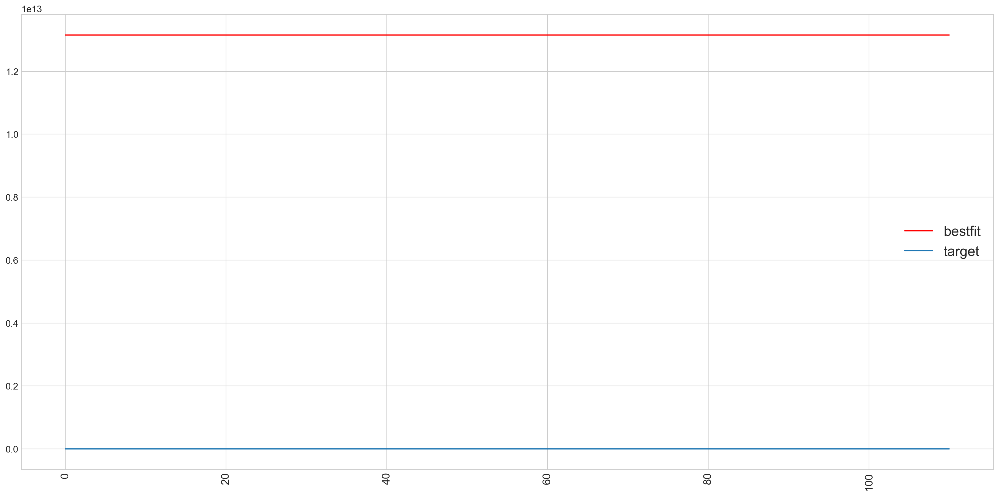

In [74]:
plt.plot(test2_predict, "r-", label='bestfit') # best fit line with new data
plt.plot(testY, label='target') # scatter points for original data 
plt.xticks(rotation = 90, size=14)
plt.legend(fontsize=18)
plt.show()

We can see that our current implementation of OLS and autoregression aren't behaving as expected. Lets modify them a little and try again. 

In [53]:
# Implementing (linear) OLS fitting using our input matrix and vector to calculate the best weights for our model.

X_b = np.c_[np.ones((len(trainX), 1)), trainX]  # add x0 = 1 to each instance,
#print(X_b.shape)
# (adding 1 to each row basically, a new column)
theta_best = np.linalg.inv(X_b.T.dot(X_b)).dot(X_b.T).dot(trainY) # W = (Xt * X + λI)-1 * Xt * Y

# should find us the best regression coefficients (weights) to reduce mse in our auto regression.

So, computing the best parameters for the model here which is theta_best, we're using a known formula to make this calculation, <br>
matrix for the training set features > transpose it > multiply with original matrix > compute inverse of reuslting matrix > multiply again with the transpose of the original matrix > finally multiply with the outcome variable vector.
<br> We can also multiply the transposed training matrix by lamda and an identity matrix to stabilize the inversion. We're using a column of 1's to do that now since the identity matrix didn't work out too well for us.


In [54]:
print(len(theta_best)) # 6 regression coefficients, because of the row of ones we added
theta_best

6


array([[ 4.68124354e+05],
       [-6.71831718e-02],
       [ 6.27952069e-01],
       [-7.13527228e-01],
       [-4.17415454e-03],
       [ 1.15000775e+00]])

Where trainY are our target observations, testX is the design matrix 

In [55]:
# Implementing Auto regressive modlel using our regression coefficients found using OLS
X_new = testX
X_new_b = np.c_[np.ones((len(X_new), 1)), X_new]  # add x0 = 1 to each instance; np.c_ concatenate arrays
# this added a second column of 1's to each row, making it a square matrix)
y_predict = X_new_b.dot(theta_best) # should be Yt = Xt * W 
# this corresponds to a linear combination of features and their coefficients
print(y_predict[90:96,:])

[[8.30423845e+07]
 [8.19454791e+07]
 [8.26713427e+07]
 [1.20239197e+08]
 [1.19419609e+08]
 [9.92835974e+07]]


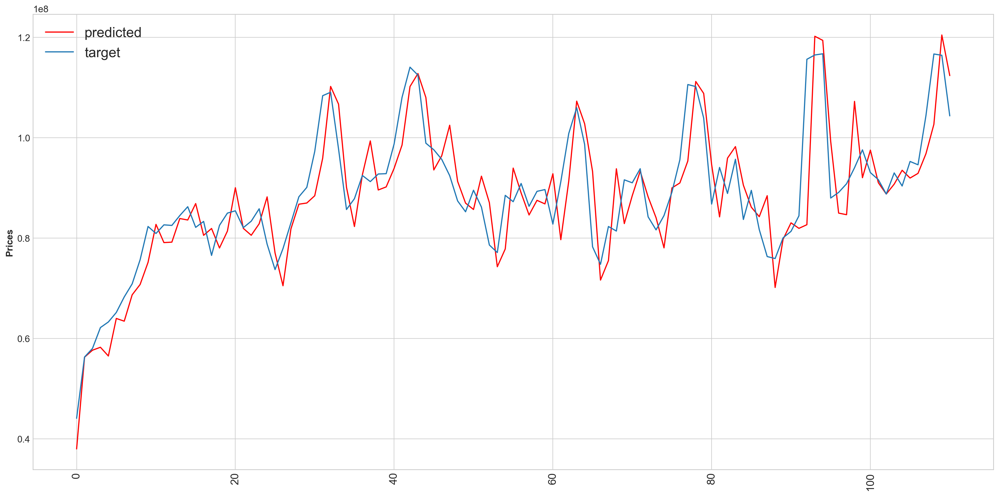

In [75]:
plt.plot(y_predict, "r-", label='predicted') # best fit line with new data
plt.plot(testY, label='target') # scatter points for original data 
plt.xticks(rotation = 90, size=14)
plt.legend(fontsize=18)
plt.ylabel('Prices')
plt.show()

In [76]:
# Getting index for predictions to plot
temp = pd.DataFrame(housing)
cols = [0]
temp = temp[temp.columns[cols]]

print(len(trainY))
print(len(testY))
print(testY[0]) # testY start
print(testY[110]) # testY end
# 337-5= 332-221= 111 - 337 = 226 (accounting for 5 slpit)(index for first value of testY in remake)
print(remake.iloc[226:227,:]) # Estimating the date for our trainY start
print(remake.iloc[336:337,:]) # Estimating the date for our trainY end

# This loop is just for me to see what I'm picking up (works)
#for i in range(5+len(trainY),len(remake),1):
    #print(temp.iloc[i:i+1])

temp2 = np.empty(0, dtype=object)
for i in range(5+len(trainY),len(remake),1):
    temp2 = np.append(temp2,temp.iloc[i:i+1])
#print(temp2)

Pred = pd.DataFrame(y_predict , index=temp2)
Pred.head()

221
111
[44076891.72781863]
[1.0437375e+08]
            City of London
Month-Year                
Nov-13        4.407689e+07
            City of London
Month-Year                
Jan-23        1.043738e+08


,0
Nov-13,3.796902e+07
Dec-13,5.626444e+07
Jan-14,5.765141e+07
Feb-14,5.823843e+07
Mar-14,5.649568e+07


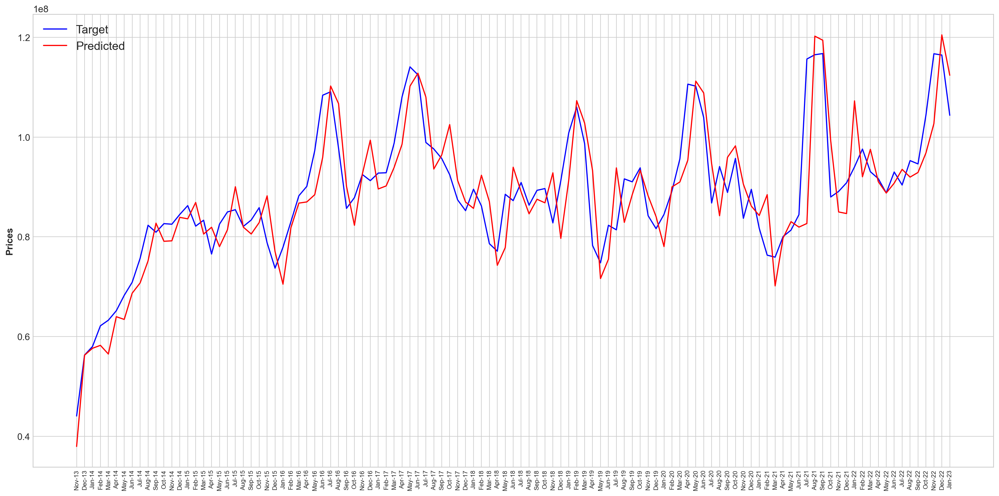

In [77]:
plt.plot(remake.iloc[5+len(trainY):len(remake),:], color='blue', label='Target') # index for original data 
plt.plot(Pred, "r-", label='Predicted') # fit line with new data
plt.xticks(rotation = 90, size=8)
plt.legend(fontsize=15)
plt.ylabel('Prices')
plt.show()

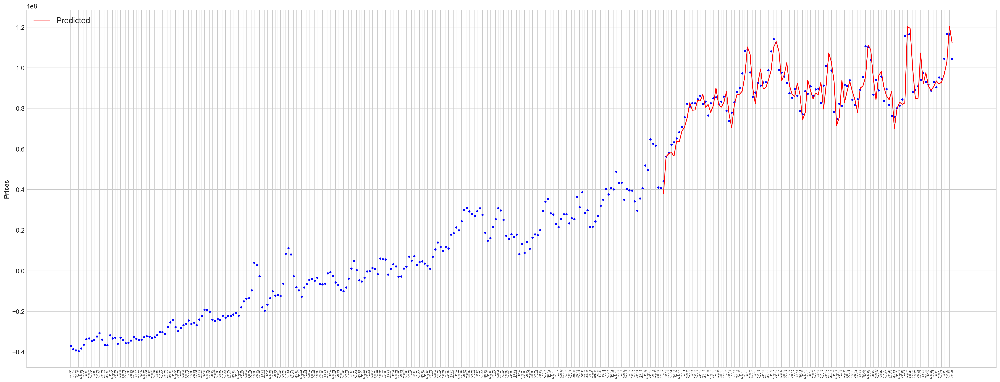

In [78]:
plt.figure(figsize = (26, 10))
plt.plot(remake, "b.")
plt.plot(Pred, "r-", label='Predicted') # best fit line with new data
plt.xticks(rotation = 90, size=5)
plt.legend(fontsize=15)
plt.ylabel('Prices')
plt.show()

# Lets properly run this on our training data now that we have something functional

In [79]:
# Implementing (linear) OLS fitting using our input matrix and vector to calculate the best weights for our model.

X_b = np.c_[np.ones((len(trainX), 1)), trainX]  # add x0 = 1 to each instance (adding 1 to each row basically,
# new column)
theta_best = np.linalg.inv(X_b.T.dot(X_b)).dot(X_b.T).dot(trainY) # W = (Xt * X + λI)-1 * Xt * Y

# should find us the best regression coefficients (weights) to reduce mse.

In [80]:
print(len(theta_best)) # 6 regression coefficients, one extra attributed to the column of ones
theta_best

6


array([[ 4.68124354e+05],
       [-6.71831718e-02],
       [ 6.27952069e-01],
       [-7.13527228e-01],
       [-4.17415454e-03],
       [ 1.15000775e+00]])

In [81]:
# Implementing Auto regressive modlel using our regression coefficients found using OLS
X_new = trainX
X_new_b = np.c_[np.ones((len(X_new), 1)), X_new]  # add x0 = 1 to each instance; np.c_ concatenate arrays
# this added a second column of 1's to each row, making it a square matrix)
y_predict = X_new_b.dot(theta_best) # should be Yt = Xt * W + Et
y_predict[90:96,:]

array([[-2958850.6923192 ],
       [-5819687.32175709],
       [-7586411.8448993 ],
       [-3813526.33212598],
       [ -138113.77224257],
       [  353856.83418644]])

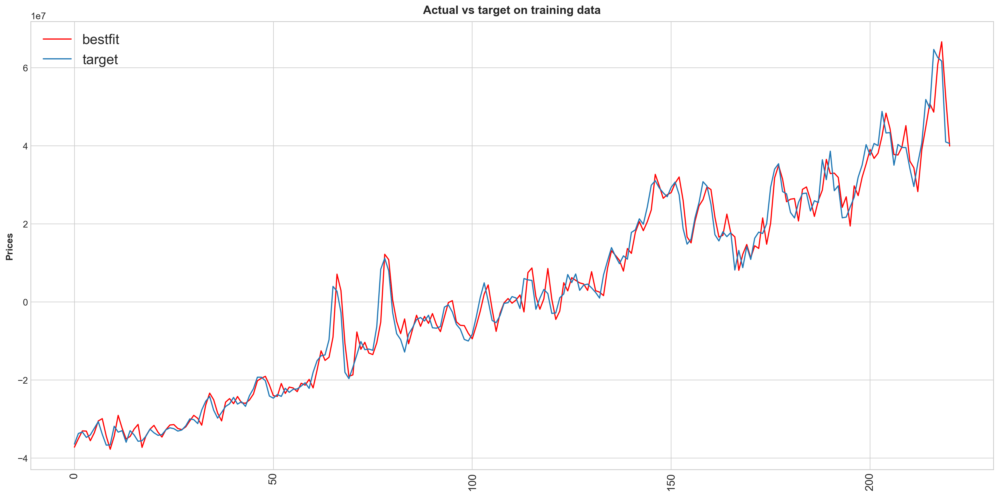

In [82]:
plt.title('Actual vs target on training data', size=15)
plt.plot(y_predict, "r-", label='bestfit') # best fit line with new data
plt.plot(trainY, label='target') # scatter points for original data 
plt.xticks(rotation = 90, size=14)
plt.legend(fontsize=18)
plt.ylabel('Prices')
plt.show()

In [83]:
# Calculating MSE
from sklearn.metrics import mean_squared_error

train_mse = mean_squared_error(trainY, y_predict)
print("Mean square error", train_mse, "\n")

# We're only using the imported mse here to check with what we're going to get from our own function. 

Mean square error 12944197475015.344 



Lets start calculating our <b> MSE ourselves </b> now in a more readable form than the one output from the library. <br>
The mean square error is the average of the square of the difference between the observed and predicted values of a variable. 

In [84]:
# Manually finding MSE
# mse = (1/len(z)) * sigma(len(z)-1)((z-x)^2)

def findMSE(z,x): # Where z = target vals, x = predicted vals
    summ = 0
    for i in range(0,len(z),1):
        diff = z[i] - x[i]
        #print(z[i],x[i]) # For if you wanna compare the pairs
        sq = diff * diff
        summ = summ + sq
    mse = summ / len(z) 
    return mse 

mse = findMSE(trainY,y_predict)
print(mse)

[1.29441975e+13]


In [85]:
print("Mean square error from lib", train_mse, "\n")
print("Mean square error from func", mse, "\n")

Mean square error from lib 12944197475015.344 

Mean square error from func [1.29441975e+13] 



In [ ]:
# Test cell
print(np.finfo(train_mse))

<b> Rerun on Test data now, </b>

In [87]:
# Implementing (linear) OLS fitting using our input matrix and vector to calculate the best weights for our model.

X_b = np.c_[np.ones((len(testX), 1)), testX]  # add x0 = 1 to each instance(adding 1 to each row basically,new column)
theta_best = np.linalg.inv(X_b.T.dot(X_b)).dot(X_b.T).dot(testY) # W = (Xt * X + λI)-1 * Xt * Y

# should find us the best regression coefficients (weights) to reduce mse.

In [88]:
print(len(theta_best)) # 6 regression coefficients
theta_best

6


array([[ 1.64073918e+07],
       [-9.62506608e-02],
       [ 4.20005566e-01],
       [-3.92507859e-01],
       [-1.36161421e-01],
       [ 1.02462076e+00]])

In [89]:
# Implementing Auto regressive modlel using our regression coefficients found using OLS
X_new = testX
X_new_b = np.c_[np.ones((len(X_new), 1)), X_new]  # add x0 = 1 to each instance; np.c_ concatenate arrays
# Basically a new column of ones to the beginning of our table/matrix. 
y_predict2 = X_new_b.dot(theta_best) # should be Yt = Xt * W + Et
y_predict2[90:96,:]

array([[8.38326728e+07],
       [8.32466424e+07],
       [8.49772221e+07],
       [1.17791910e+08],
       [1.13352218e+08],
       [1.02408063e+08]])

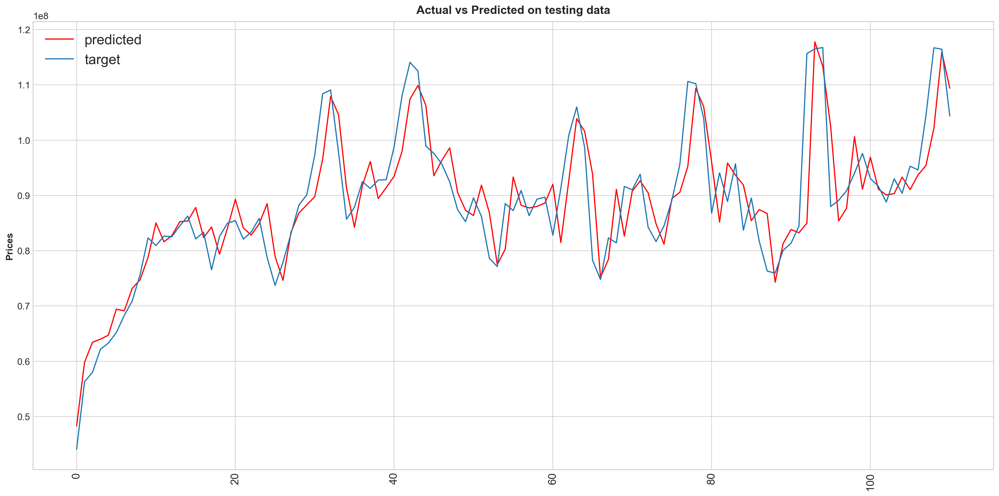

In [90]:
plt.title('Actual vs Predicted on testing data', size=15)
plt.plot(y_predict2, "r-", label='predicted') # best fit line with new data
plt.plot(testY, label='target') # scatter points for original data 
plt.xticks(rotation = 90, size=14)
plt.legend(fontsize=18)
plt.ylabel('Prices')
plt.show()

In [91]:
# Calculating MSE (imported above)

test_mse = mean_squared_error(testY, y_predict2)
print("Mean square error", test_mse, "\n")

Test_mse = findMSE(testY,y_predict2)
print("Mean squared error using func", mse)

Mean square error 39279652564716.4 

Mean squared error using func [1.29441975e+13]


 From here on out, we'll just stick to using our own function to calculate MSE.

Plotting overall bestfit against raw data and comparing mse.

In [92]:
# Getting index for training predictions to plot by coverting them back into a dataframe
temp = pd.DataFrame(housing)
cols = [0]
temp = temp[temp.columns[cols]]

print(len(trainY))
print(len(testY))
print(trainY[0]) # testY start
print(trainY[220]) # testY end
# 337 - 112 = 225 (index for last value of trainY in remake)
print(remake.iloc[5:6,:]) # Estimating the date for our trainY start
print(remake.iloc[225:226,:]) # Estimating the date for our trainY end

# This loop is just for me to see what I'm picking up (works)
#for i in range(5,5+len(trainY),1):
    #print(temp.iloc[i:i+1])

temp2 = np.empty(0, dtype=object)
for i in range(5,5+len(trainY),1):
    temp2 = np.append(temp2,temp.iloc[i:i+1])
#print(temp2)

Pred_train = pd.DataFrame(y_predict , index=temp2)
Pred_train.head()

221
111
[-36391572.16489646]
[40618948.01486813]
            City of London
Month-Year                
Jun-95       -3.639157e+07
            City of London
Month-Year                
Oct-13        4.061895e+07


,0
Jun-95,-3.718040e+07
Jul-95,-3.501462e+07
Aug-95,-3.302174e+07
Sep-95,-3.307409e+07
Oct-95,-3.553342e+07


In [93]:
# Getting index for testing predictions
temp = pd.DataFrame(housing)
cols = [0]
temp = temp[temp.columns[cols]]

print(len(trainY))
print(len(testY))
print(testY[0]) # testY start
print(testY[110]) # testY end
# 337-5= 332-221= 111 - 337 = 226 (accounting for 5 slpit)(index for first value of testY in remake)
print(remake.iloc[226:227,:]) # Estimating the date for our testY start
print(remake.iloc[336:337,:]) # Estimating the date for our testY end

# This loop is just for me to see what I'm picking up (works)
#for i in range(5+len(trainY),len(remake),1):
    #print(temp.iloc[i:i+1])

temp2 = np.empty(0, dtype=object)
for i in range(5+len(trainY),len(remake),1):
    temp2 = np.append(temp2,temp.iloc[i:i+1])
#print(temp2)

Pred_test = pd.DataFrame(y_predict2 , index=temp2)
Pred_test.head()

221
111
[44076891.72781863]
[1.0437375e+08]
            City of London
Month-Year                
Nov-13        4.407689e+07
            City of London
Month-Year                
Jan-23        1.043738e+08


,0
Nov-13,4.830334e+07
Dec-13,5.982896e+07
Jan-14,6.343043e+07
Feb-14,6.398540e+07
Mar-14,6.470995e+07


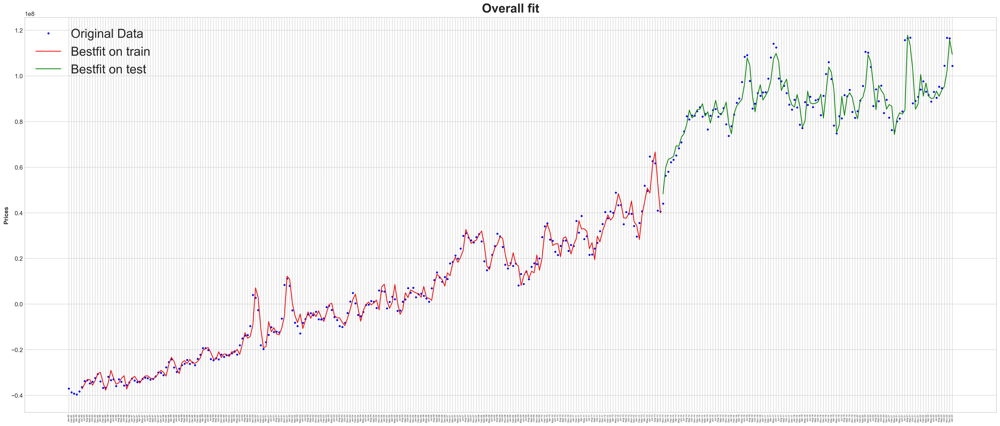

In [99]:
plt.figure(figsize = (28, 12))
plt.title('Overall fit', size=25)
plt.plot(remake, "b.", label='Original Data') # Scatter points for original data
plt.plot(Pred_train, "r-", label='Bestfit on train') # best fit line with training pred
plt.plot(Pred_test, "g-", label='Bestfit on test') # best fit line with testing pred
plt.xticks(rotation = 90, size=5)
plt.legend(fontsize=25)
plt.ylabel('Prices')
plt.show()

In [100]:
print("Mean square error on training data", mse, "\n")
print("Mean square error on testing data", Test_mse, "\n")

print("Difference in MSE", Test_mse - mse, "\n") #train_mse

Mean square error on training data [1.29441975e+13] 

Mean square error on testing data [3.92796526e+13] 

Difference in MSE [2.63354551e+13] 



We can see above that the MSE is higher on our testing data as oppposed to our testing data. This is a good sign that the model is behaving in a controlled manner. MSE should be slightly higher on unseen data for the model, we know this way it is not overfitting.

## Polynomial Model
Lets start by making some polynomial data. <br>
We are going to achieve this by writing a function to extract each column one by one from the training data, squaring all the values inside and concatenating this squared column back to end of the original data. <br> We can get up to XN^2 new columns this way. In our case, we end up with X5^2-X9^2 columns from our original X0 - X4 columns from our training data columns. It will be the same for the training data.

In [122]:
# Check data to make sure what we're starting with.
print(trainX.dtype)
print(trainY.dtype)
print(testX.dtype)
print(testY.dtype)
print(trainX[0:4,0:5]) # indexing to slice np array
print(trainX.shape[0])
print(trainX.shape)


float64
float64
float64
float64
[[-37006270.22849938 -38652706.58309747 -39201518.70129684
  -39561220.34917573 -38259883.8923941 ]
 [-38652706.58309747 -39201518.70129684 -39561220.34917573
  -38259883.8923941  -36391572.16489646]
 [-39201518.70129684 -39561220.34917573 -38259883.8923941
  -36391572.16489646 -33680098.40635598]
 [-39561220.34917573 -38259883.8923941  -36391572.16489646
  -33680098.40635598 -33288166.06626616]]
221
(221, 5)


Creating our polynomial data from our original data

In [123]:
def polyBuild(z): # two nested loops for accessing index i and j of the 2d array
    newCol = z
    for i in range(0,z.shape[1],1):
        tempCol = np.empty(0, dtype=object)   
        for j in range(0,z.shape[0],1): # or you could transpose
            temp = z[j:j+1,i:i+1]
            sqa = temp*temp
            tempCol = np.append(tempCol,sqa)
            #print(tempCol)
        #print(newCol)
        newCol = np.c_[newCol, tempCol]
    return newCol

In [124]:
# Test cell to check if function works
testing = np.copy(trainX)
print("non poly", testing[218:223,0:7])

testing = polyBuild(trainX)
print("poly", testing[218:223,0:10])

# It works. We can see in the output below, each column was squared and added back to the end.

non poly [[40707983.07622428 51892745.55390773 49640514.64184232 64716465.44103535
  62653701.13953586]
 [51892745.55390773 49640514.64184232 64716465.44103535 62653701.13953586
  61715449.66296465]
 [49640514.64184232 64716465.44103535 62653701.13953586 61715449.66296465
  41018715.44035728]]
poly [[40707983.07622428 51892745.55390773 49640514.64184232 64716465.44103535
  62653701.13953586 1657139886134162.5 2692857041122610.5
  2464180693906962.0 4188220899180723.0 3925486266482277.0]
 [51892745.55390773 49640514.64184232 64716465.44103535 62653701.13953586
  61715449.66296465 2692857041122610.5 2464180693906962.0
  4188220899180723.0 3925486266482277.0 3808796727101923.5]
 [49640514.64184232 64716465.44103535 62653701.13953586 61715449.66296465
  41018715.440357275 2464180693906962.0 4188220899180723.0
  3925486266482277.0 3808796727101923.5 1682535016377004.2]]


In [125]:
# Now lets turn our datasets into polynomial sets. Note, we won't be converting our Y sets since they're our targets.

trainXpoly = polyBuild(trainX)
trainXpoly = trainXpoly.astype(float)
print("poly train", trainXpoly[0:4,0:10])
print("The resulting shape of our new train set, ",trainXpoly.shape)

testXpoly = polyBuild(testX)
testXpoly = testXpoly.astype(float)
print("poly test", testXpoly[0:4,0:10])
print("The resulting shape of our new test set, ",testXpoly.shape)

poly train [[-3.70062702e+07 -3.86527066e+07 -3.92015187e+07 -3.95612203e+07
  -3.82598839e+07  1.36946404e+15  1.49403173e+15  1.53675907e+15
   1.56509016e+15  1.46381872e+15]
 [-3.86527066e+07 -3.92015187e+07 -3.95612203e+07 -3.82598839e+07
  -3.63915722e+07  1.49403173e+15  1.53675907e+15  1.56509016e+15
   1.46381872e+15  1.32434652e+15]
 [-3.92015187e+07 -3.95612203e+07 -3.82598839e+07 -3.63915722e+07
  -3.36800984e+07  1.53675907e+15  1.56509016e+15  1.46381872e+15
   1.32434652e+15  1.13434903e+15]
 [-3.95612203e+07 -3.82598839e+07 -3.63915722e+07 -3.36800984e+07
  -3.32881661e+07  1.56509016e+15  1.46381872e+15  1.32434652e+15
   1.13434903e+15  1.10810200e+15]]
The resulting shape of our new train set,  (221, 10)
poly test [[6.47164654e+07 6.26537011e+07 6.17154497e+07 4.10187154e+07
  4.06189480e+07 4.18822090e+15 3.92548627e+15 3.80879673e+15
  1.68253502e+15 1.64989894e+15]
 [6.26537011e+07 6.17154497e+07 4.10187154e+07 4.06189480e+07
  4.40768917e+07 3.92548627e+15 3.8087

<b> We have now doubled the size of our data by increasing the feature columns we had by two fold. Lets plug this data into our model see how much of a difference the polynomial features make to our loss. </b>

In [126]:
# Implementing OLS fitting using our new input matrix and vector y to calculate the best weights for our model.

X_b = np.c_[np.ones((len(trainXpoly), 1)), trainXpoly]  # add x0 = 1 to each instance 
# (adding 1 to each row basically, new column)
theta_best = np.linalg.inv(X_b.T.dot(X_b)).dot(X_b.T).dot(trainY) # W = (Xt * X + λI)-1 * Xt * Y

In [127]:
print(len(theta_best)) # 11 regression coefficients. As before, one extra attributed to the col of 1's
theta_best

11


array([[ 7.68228844e+05],
       [-3.24457148e-02],
       [ 4.96371674e-01],
       [-4.97035099e-01],
       [-1.52583623e-01],
       [ 1.17989461e+00],
       [-2.38303712e-10],
       [ 2.01121238e-09],
       [-5.49434572e-09],
       [ 3.69991490e-09],
       [-4.72315181e-10]])

In [128]:
# Implementing Auto regressive modlel using our regression coefficients found using OLS
X_new = trainXpoly
X_new_b = np.c_[np.ones((len(X_new), 1)), X_new]  # add x0 = 1 to each instance; np.c_ concatenate arrays
trP_y_predict = X_new_b.dot(theta_best) # should be Yt = Xt * W 
print(len(trP_y_predict))
trP_y_predict[90:96,:]

221


array([[-2503857.16760106],
       [-5985903.78662081],
       [-6614775.84083634],
       [-3934858.77324218],
       [  339663.43155038],
       [  -13544.37781708]])

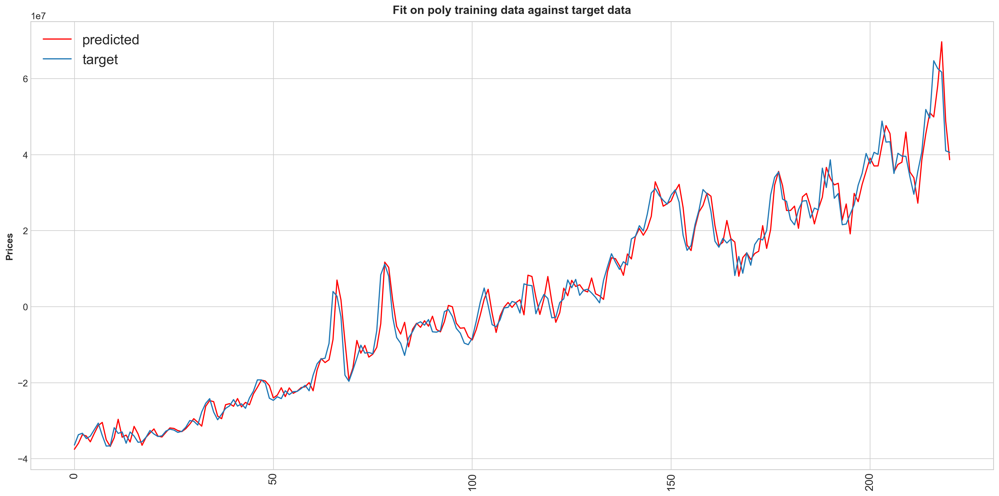

In [129]:
plt.title('Fit on poly training data against target data', size=15)
plt.plot(trP_y_predict, "r-", label='predicted') # best fit line with new data
plt.plot(trainY, label='target') # scatter points for original data 
plt.xticks(rotation = 90, size=14)
plt.legend(fontsize=18)
plt.ylabel('Prices')
plt.show()

In [130]:
trP_mse = findMSE(trainY,trP_y_predict)
print("MSE on Polynomial training data", trP_mse) # using mse func, not lib

MSE on Polynomial training data [1.23751251e+13]


Let's run our <b> polynomial testing </b> data through the same thing and see how it turns out.

In [131]:
# Implementing (linear) OLS fitting using our input matrix and vector to calculate the best weights for our model.

X_b = np.c_[np.ones((len(testXpoly), 1)), testXpoly]  

theta_best = np.linalg.inv(X_b.T.dot(X_b)).dot(X_b.T).dot(testY) 

In [132]:
print(len(theta_best)) # 6 regression coefficients
theta_best

11


array([[-6.90303456e+06],
       [ 8.90027396e-01],
       [-7.48538843e-01],
       [-3.10700841e-01],
       [ 1.93229657e+00],
       [-2.89596698e-01],
       [-5.61855198e-09],
       [ 6.30401547e-09],
       [-5.61881420e-10],
       [-1.11551647e-08],
       [ 6.73393287e-09]])

In [133]:
# Implementing Auto regressive modlel using our regression coefficients found using OLS
X_new = testXpoly
X_new_b = np.c_[np.ones((len(X_new), 1)), X_new]  # add x0 = 1 to each instance; np.c_ concatenate arrays
# this added a new column of 1's 
teP_y_predict = X_new_b.dot(theta_best) # should be Yt = Xt * W + Et
print(len(teP_y_predict ))
teP_y_predict[90:96,:]

111


array([[8.40565283e+07],
       [8.52712170e+07],
       [8.62651782e+07],
       [1.19966780e+08],
       [1.10857935e+08],
       [9.82917499e+07]])

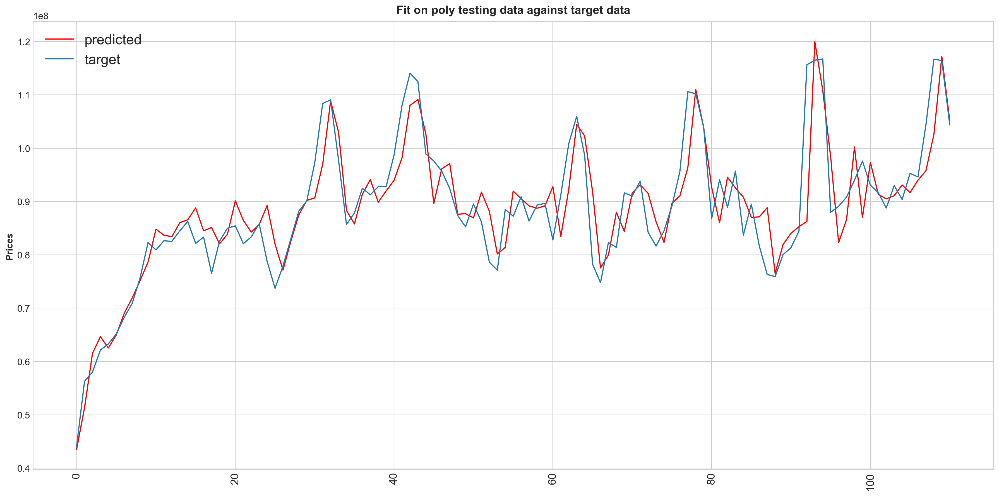

In [134]:
plt.title('Fit on poly testing data against target data', size=15)
plt.plot(teP_y_predict, "r-", label='predicted') # best fit line with new data
plt.plot(testY, label='target') # scatter points for original data 
plt.xticks(rotation = 90, size=14)
plt.legend(fontsize=18)
plt.ylabel('Prices')
plt.show()

In [135]:
teP_mse = findMSE(testY,teP_y_predict)
print("MSE on Polynomial testing data", teP_mse) # using mse func, not lib

MSE on Polynomial testing data [3.55474005e+13]


In [136]:
# Function to add date index back to our training predictions, same as we did for our linear data, converted to a func

def addTrainI(z):
    temp = pd.DataFrame(housing)
    cols = [0]
    temp = temp[temp.columns[cols]]
    temp2 = np.empty(0, dtype=object)
    
    for i in range(5,5+len(trainY),1):
        temp2 = np.append(temp2,temp.iloc[i:i+1])
    #print(temp2)
    
    Predi_train = pd.DataFrame(z , index=temp2)
    #Predi_train.head()
    return Predi_train

In [137]:
# Function to add date index back to our testing predictions

def addTestI(z):
    temp = pd.DataFrame(housing)
    cols = [0]
    temp = temp[temp.columns[cols]]
    temp2 = np.empty(0, dtype=object)
    
    for i in range(5+len(trainY),len(remake),1):
        temp2 = np.append(temp2,temp.iloc[i:i+1])
    #print(temp2)
    
    Predi_test = pd.DataFrame(z , index=temp2)
    #Predi_test.head()
    return Predi_test

In [138]:
trP_y_predict = addTrainI(trP_y_predict)
print(trP_y_predict.head())

teP_y_predict = addTestI(teP_y_predict)
print(teP_y_predict.head())

                   0
Jun-95 -3.750459e+07
Jul-95 -3.594719e+07
Aug-95 -3.366364e+07
Sep-95 -3.402062e+07
Oct-95 -3.554803e+07
                   0
Nov-13  4.353568e+07
Dec-13  5.133023e+07
Jan-14  6.151574e+07
Feb-14  6.464492e+07
Mar-14  6.253031e+07


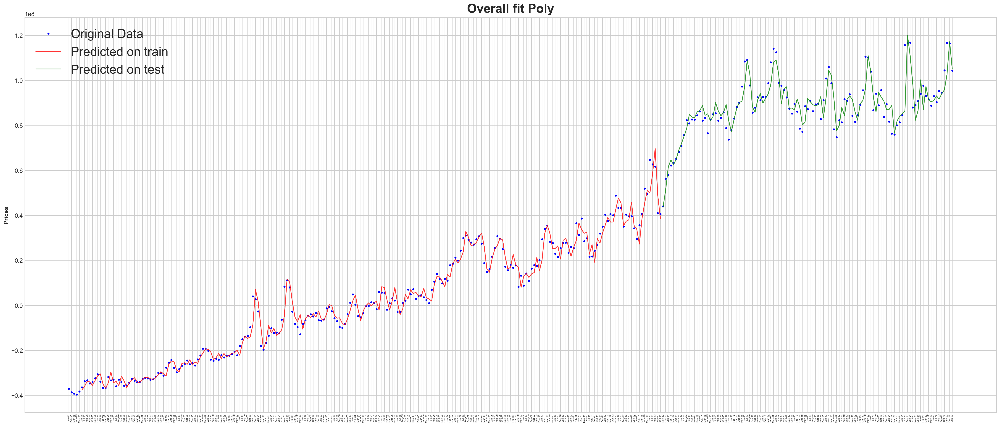

In [141]:
plt.figure(figsize = (28, 12))
plt.title('Overall fit Poly', size=25)
plt.plot(remake, "b.", label='Original Data') # Scatter points for original data
plt.plot(trP_y_predict, "r-", label='Predicted on train', alpha=0.8) # best fit line with training pred
plt.plot(teP_y_predict, "g-", label='Predicted on test', alpha=0.8) # best fit line with testing pred
plt.xticks(rotation = 90, size=5)
plt.legend(fontsize=25)
plt.ylabel('Prices')
plt.show()

In [140]:
print("Mean square error on poly training data", trP_mse, "\n")
print("Mean square error on poly testing data", teP_mse, "\n")

print("Difference in MSE", trP_mse - teP_mse, "\n") #train_mse

Mean square error on poly training data [1.23751251e+13] 

Mean square error on poly testing data [3.55474005e+13] 

Difference in MSE [-2.31722754e+13] 



In [143]:
# MSE for linear.
print("Mean square error on training data for linear", mse, "\n")
print("Mean square error on testing data for linear", Test_mse, "\n")

Mean square error on training data for linear [1.29441975e+13] 

Mean square error on testing data for linear [3.92796526e+13] 



# Lets try this on a Neural Network now

In [144]:
from sklearn.neural_network import MLPRegressor

mlp_model = MLPRegressor()
mlp_model.get_params() # the default params

{'activation': 'relu',
 'alpha': 0.0001,
 'batch_size': 'auto',
 'beta_1': 0.9,
 'beta_2': 0.999,
 'early_stopping': False,
 'epsilon': 1e-08,
 'hidden_layer_sizes': (100,),
 'learning_rate': 'constant',
 'learning_rate_init': 0.001,
 'max_fun': 15000,
 'max_iter': 200,
 'momentum': 0.9,
 'n_iter_no_change': 10,
 'nesterovs_momentum': True,
 'power_t': 0.5,
 'random_state': None,
 'shuffle': True,
 'solver': 'adam',
 'tol': 0.0001,
 'validation_fraction': 0.1,
 'verbose': False,
 'warm_start': False}

In [153]:
# Model 1

mlp0_model = MLPRegressor(
    hidden_layer_sizes=1, activation='tanh', solver='sgd', alpha=0.0002, learning_rate='constant', 
    learning_rate_init=0.001, max_iter=50, early_stopping=True
)

In [154]:
mlp0_model.fit(trainX, trainY.ravel()) # ravel because fit expects a flat array which is different from Y's form

MLPRegressor(activation='tanh', alpha=0.0002, early_stopping=True,
             hidden_layer_sizes=1, max_iter=50, solver='sgd')

In [155]:
y_pred_mlp0 = mlp0_model.predict(testX)

In [156]:
mlp0_model.score(testX, testY)

-38.8549854400989

In [157]:
print(len(y_pred_mlp0))
y_pred_mlp0[90] # Just a val for me to check the output and num of predictions 

111


8173365.245143028

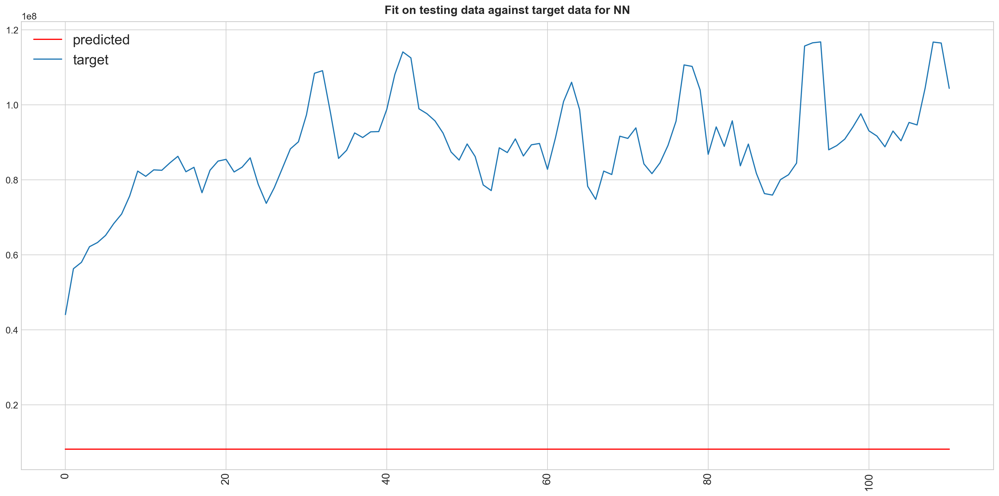

In [159]:
plt.title('Fit on testing data against target data for NN', size=15)
plt.plot(y_pred_mlp0, "r-", label='predicted') # best fit line with new data
plt.plot(testY, label='target') # scatter points for original data 
plt.xticks(rotation = 90, size=14)
plt.legend(fontsize=18)
plt.show()

In [158]:
print("MSE:", findMSE(testY, y_pred_mlp0))

MSE: [6.67154434e+15]


For the cell below, sgd (stochastic gradient descent) does absolutely terrible, everything comes out exactly the same tiny value and the number hidden layers makes absolutely no difference. However, if I was to use the default solver, adam (stochastic gradient-based optimizer) or lbfgs (quasi-Newton methods), we end up values that are actually usable.

In [160]:
# Model 2

mlp1_model = MLPRegressor(random_state=1, max_iter=900, solver="lbfgs")
mlp1_model.fit(trainX, trainY.ravel())

MLPRegressor(max_iter=900, random_state=1, solver='lbfgs')

In [161]:
y_pred_mlp1 = mlp1_model.predict(trainX)
print(mlp1_model.score(trainX, trainY))
print(y_pred_mlp1[90])

0.9909257022437274
-334973.91818649124


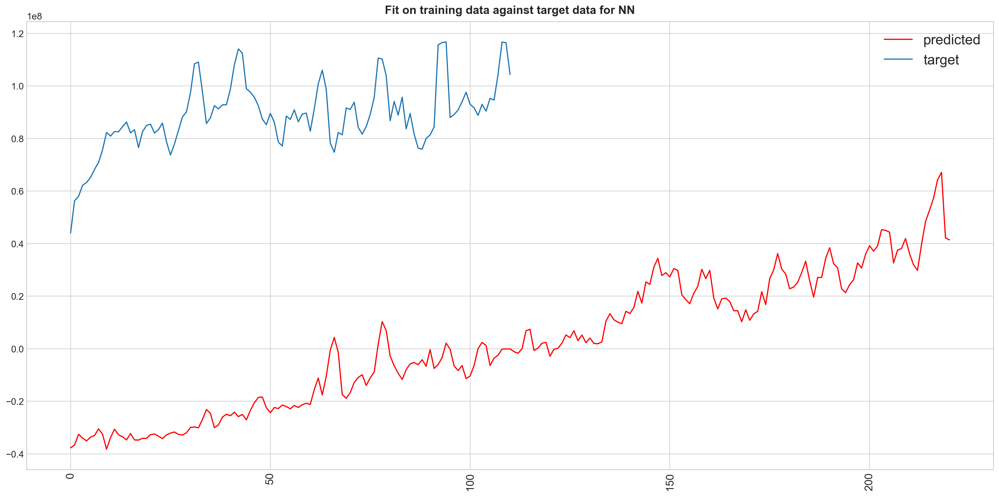

In [162]:
plt.title('Fit on training data against target data for NN', size=15)
plt.plot(y_pred_mlp1, "r-", label='predicted') # best fit line with new data
plt.plot(testY, label='target') # scatter points for original data 
plt.xticks(rotation = 90, size=14)
plt.legend(fontsize=18)
plt.show()

In [163]:
y_pred_mlp2 = mlp1_model.predict(testX)
print(mlp1_model.score(testX, testY))
print(y_pred_mlp2[90])

0.5437219482653366
77365996.57200894


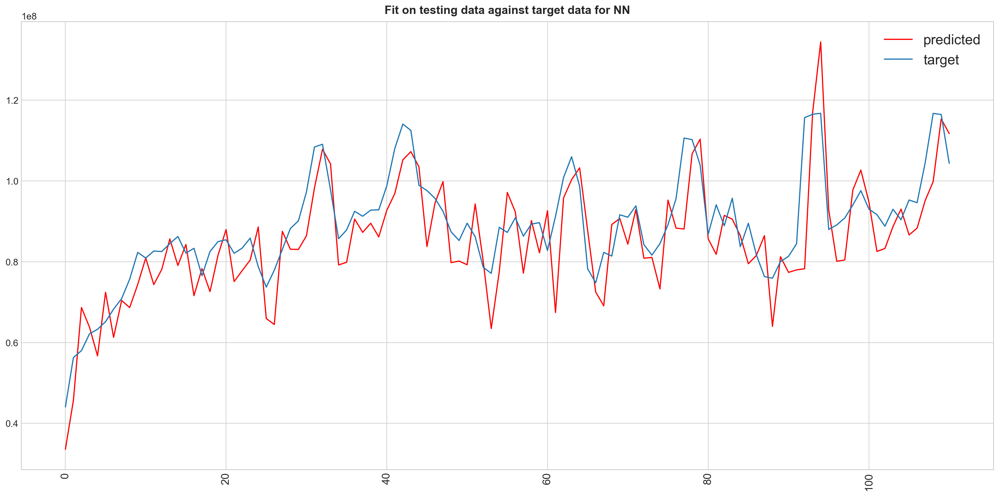

In [164]:
plt.title('Fit on testing data against target data for NN', size=15)
plt.plot(y_pred_mlp2, "r-", label='predicted') # best fit line with new data
plt.plot(testY, label='target') # scatter points for original data 
plt.xticks(rotation = 90, size=14)
plt.legend(fontsize=18)
plt.show()

We can see values begin to converge with some tweaks to the parameters

In [171]:
print("MSE:", findMSE(testY, y_pred_mlp2))

MSE: [7.63788826e+13]


In [165]:
# Model 3

mlp2_model = MLPRegressor(random_state=1, max_iter=800, solver="adam")
mlp2_model.fit(trainX, trainY.ravel())

MLPRegressor(max_iter=800, random_state=1)

In [166]:
y_pred_mlp3 = mlp2_model.predict(testX)
print(y_pred_mlp3[90])
mlp2_model.score(testX, testY)

78494903.36159699


0.644573478231986

In [167]:
print(mlp2_model.loss_curve_[2])# Only accessible when solver=’sgd’ or ‘adam’.

74727193531143.0


The curve below is showing us the loss decreasing with each iteration for our NN

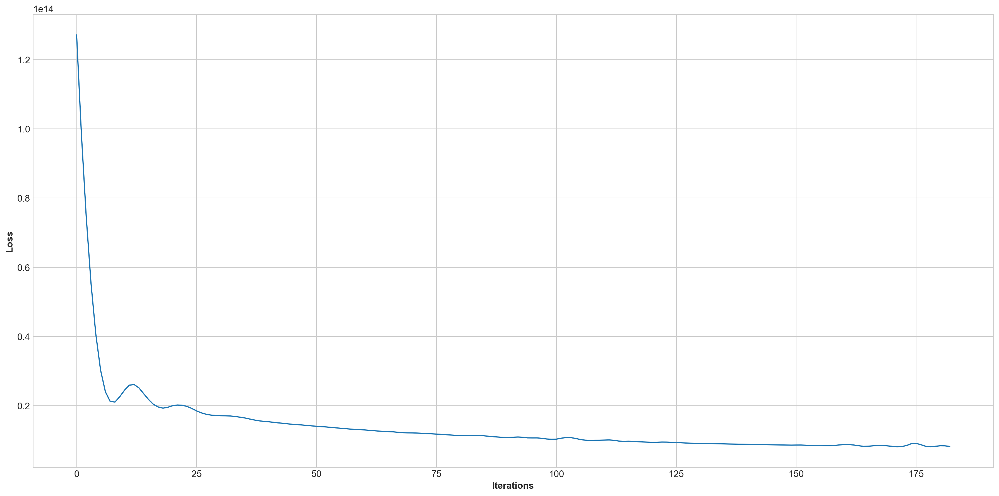

In [168]:
plt.plot(mlp2_model.loss_curve_, label='loss')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.show()

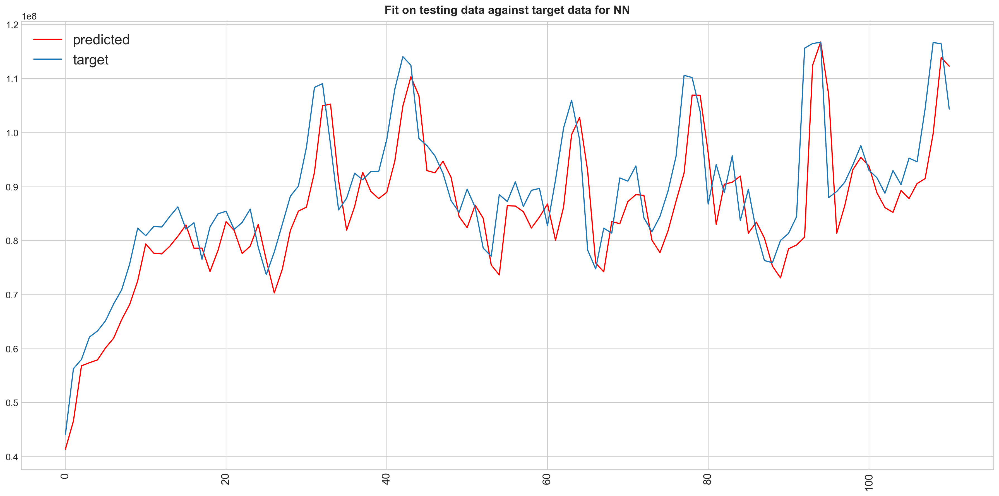

In [169]:
plt.title('Fit on testing data against target data for NN', size=15)
plt.plot(y_pred_mlp3, "r-", label='predicted') # best fit line with new data
plt.plot(testY, label='target') # scatter points for original data 
plt.xticks(rotation = 90, size=14)
plt.legend(fontsize=18)
plt.show()

In [170]:
mlp2_mse = findMSE(testY, y_pred_mlp3)
print("MSE:", mlp2_mse)

MSE: [5.94967925e+13]


We can see that our third model performed the best so far, judging by mse.

Spacer ---

Now that we've done three NN models, we can see that we achieve different results depending the hyper parameters we set for our NN. But this can be tiresome to constantly repeat. Luckily for us, we can use GridsearchCV to burden with that responsibility for us. We can hand it lists of hyper parameters to try in multiple multiple models and return the one that results in the lowest loss.

In [173]:
from sklearn.model_selection import GridSearchCV

# Lets set our own hyperparams for gridsearchCV
hyperparamGrid = {
      'hidden_layer_sizes': [(1), (2), (3)], 
      'activation': ['relu', 'tanh'], 
#tanh smooth activation function, relu relu is almost linear, not suited for learning this simple non-linear function.
      'solver': ['adam','lbfgs'], #lbfgs might work better
      'alpha': [ 0.001, 0.1, 0.2, 0.4],
      'learning_rate': ['constant', 'invscaling', 'adaptive'],
      'learning_rate_init': [ 0.01,0.001,0.5 ], 
      'max_iter': [500, 800, 1000],
      'random_state': [0,1],
      'early_stopping': [True,False]
      }

In [174]:
grid_search_mlp = GridSearchCV( mlp_model, hyperparamGrid, cv = 5, scoring = 'neg_mean_squared_error', 
      return_train_score=True)

grid_search_mlp.fit(trainX, trainY.ravel()) # This takes a while to execute, like a few minutes

GridSearchCV(cv=5, estimator=MLPRegressor(),
             param_grid={'activation': ['relu', 'tanh'],
                         'alpha': [0.001, 0.1, 0.2, 0.4],
                         'early_stopping': [True, False],
                         'hidden_layer_sizes': [1, 2, 3],
                         'learning_rate': ['constant', 'invscaling',
                                           'adaptive'],
                         'learning_rate_init': [0.01, 0.001, 0.5],
                         'max_iter': [500, 800, 1000], 'random_state': [0, 1],
                         'solver': ['adam', 'lbfgs']},
             return_train_score=True, scoring='neg_mean_squared_error')

In [175]:
print(grid_search_mlp.best_params_, "\n")
print(grid_search_mlp.best_estimator_, "\n")
print(-grid_search_mlp.best_score_, "\n")

{'activation': 'relu', 'alpha': 0.4, 'early_stopping': True, 'hidden_layer_sizes': 3, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 500, 'random_state': 0, 'solver': 'lbfgs'} 

MLPRegressor(alpha=0.4, early_stopping=True, hidden_layer_sizes=3,
             learning_rate_init=0.01, max_iter=500, random_state=0,
             solver='lbfgs') 

59740771964932.19 



The best hyperparameter combination found:

In [176]:
best_mlp_model = grid_search_mlp.best_estimator_

In [177]:
y_pred_mlp4 = best_mlp_model.predict(testX)

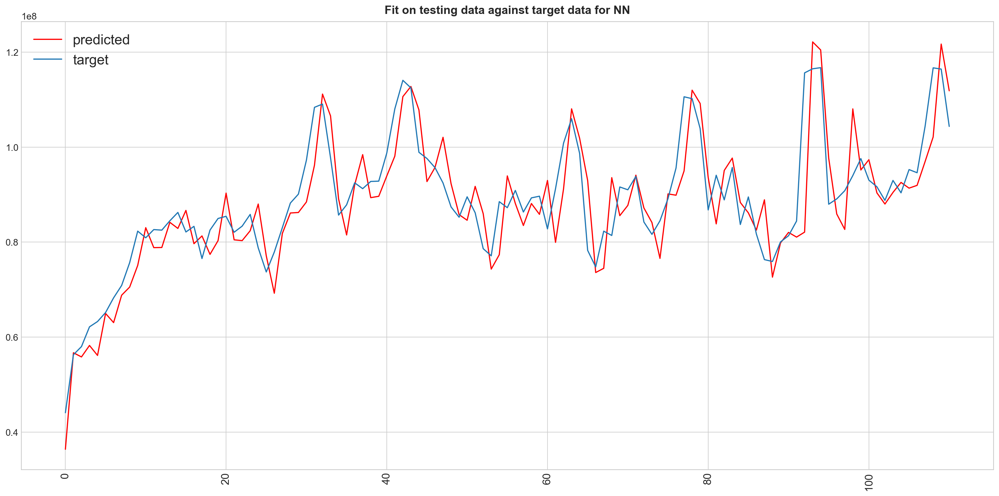

In [178]:
plt.title('Fit on testing data against target data for NN', size=15)
plt.plot(y_pred_mlp4, "r-", label='predicted') # best fit line with new data
plt.plot(testY, label='target') # scatter points for original data 
plt.xticks(rotation = 90, size=14)
plt.legend(fontsize=18)
plt.show()

In [179]:
mlp3_mse = findMSE(testY, y_pred_mlp4)
print("MSE:", mlp3_mse)

MSE: [4.77002905e+13]


In [180]:
mlp_predict = addTestI(y_pred_mlp4)
print(mlp_predict.head())

                   0
Nov-13  3.638073e+07
Dec-13  5.670396e+07
Jan-14  5.582449e+07
Feb-14  5.823843e+07
Mar-14  5.614378e+07


## Conclusion

Now that we've done an extensive amount of testing and modeling, lets do a final round up of every models performance on the test set and see which performed the best.

In [183]:
# We're evaluating performance on the test set only.

print("Mean square error on Linear", Test_mse, "\n")
print("Mean square error on Polynomial", teP_mse, "\n")
print("Mean square error on MLP:", mlp3_mse)

Mean square error on Linear [3.92796526e+13] 

Mean square error on Polynomial [3.55474005e+13] 

Mean square error on MLP: [4.77002905e+13]


In theory, this higher mse on our MLP should translate to a better fit (i.e. less overfitting), and make it more robust in terms of handling unseen data.

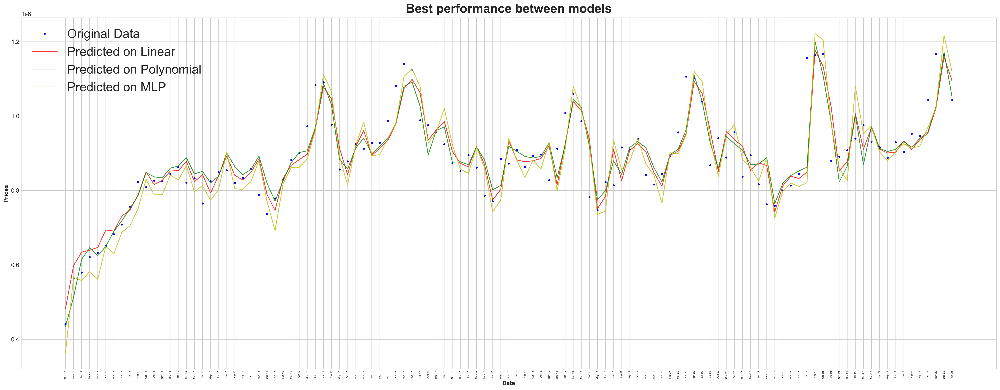

In [182]:
plt.figure(figsize = (28, 11))
plt.title('Best performance between models', size=25)
plt.plot(remake.iloc[226:337,:], "b.", label='Original Data') # Scatter points for training data
plt.plot(Pred_test, "r-", label='Predicted on Linear', alpha=0.8) # best fit line with training pred
plt.plot(teP_y_predict, "g-", label='Predicted on Polynomial', alpha=0.8) # best fit line with testing pred
plt.plot(mlp_predict, "y-", label='Predicted on MLP', alpha=0.8) # best fit line with testing pred
plt.xticks(rotation = 90, size=5)
plt.legend(fontsize=25)
plt.xlabel('Date')
plt.ylabel('Prices')
plt.show()

## Final remarks

It appears polynomial has performed the best here. 


Data Picked up from, <br>
https://data.london.gov.uk/dataset/uk-house-price-index
    <br><br>
Info about picked up data, <br>
https://www.gov.uk/government/publications/about-the-uk-house-price-index/about-the-uk-house-price-index#:~:text=The%20UK%20House%20Price%20Index%20(%20UK%20HPI%20)%20captures%20changes%20in,in%20Scotland%20since%20January%202004 <br> <br>

Disclaimer, <br>
Contains HM Land Registry data © Crown copyright and database right 2020. This data is licensed under the Open Government Licence v3.0.